In [46]:
import os
import requests
import pandas as pd
from dotenv import load_dotenv

from langchain.chat_models import ChatOpenAI
from langchain_experimental.agents.agent_toolkits import create_pandas_dataframe_agent


# .env 読み込み
print(r"..\environment\.env")
load_dotenv(dotenv_path=r'..\environment/.env',override=True)

# =========================
# 🔐 Metabase 認証・データ取得
# =========================

login_url = "https://metabase.tr-com.net/api/session"
username = os.getenv("MB_USERNAME", "").strip()
password = os.getenv("MB_PASSWORD", "").strip()

if not username or not password:
    raise ValueError("❌ MB_USERNAME または MB_PASSWORD が設定されていません")

print(f"ログイン試行中 → username: '{username}'")

response = requests.post(login_url, json={"username": username, "password": password})
if response.status_code == 200:
    session_id = response.json().get("id")
    print("✅ ログイン成功")
else:
    raise Exception(f"❌ ログイン失敗: {response.status_code}, {response.text}")


..\environment\.env
ログイン試行中 → username: 'y-nitta@torishima.co.jp'
✅ ログイン成功


In [47]:

# データ取得
url = "https://metabase.tr-com.net/api/card/2091/query/json"
headers = {
    "Content-Type": "application/json",
    "X-Metabase-Session": session_id
}

# Payload
payload = {
    "parameters": [
        {
            "type": "category",
            "target": ["variable", ["template-tag", "sensorid"]],
            "value": "VB39660F"
        }
    ]
}


In [48]:

response = requests.post(url, headers=headers, json=payload)
if response.status_code == 200:
    try:
        data = response.json()
        dfori = pd.DataFrame(data)
        if dfori.empty:
            raise ValueError("❌ 取得したデータが空です。Metabaseを確認してください。")
        print("✅ データ取得成功")
        print(dfori.head())

    except Exception as e:
        raise Exception(f"❌ データ取得・DataFrame変換失敗: {e}")
else:
    raise Exception(f"❌ データ取得失敗: {response.status_code}, {response.text}")


✅ データ取得成功
   Sensorid sensortype          record_date  temperature  x_vrmsacc  \
0  VB39660F          M  2019-09-03T03:02:45          NaN        NaN   
1  VB39660F          M  2019-09-03T04:35:48        23.26  43.700787   
2  VB39660F          M  2019-09-03T04:35:48          NaN        NaN   
3  VB39660F          M  2019-09-03T05:35:48        24.12  13.385827   
4  VB39660F          M  2019-09-03T06:35:47        24.12  13.385827   

   x_kurtosisacc  
0            NaN  
1            NaN  
2            NaN  
3            NaN  
4            NaN  


In [49]:
dfori

,Sensorid,sensortype,record_date,temperature,x_vrmsacc,x_kurtosisacc
0,VB39660F,M,2019-09-03T03:02:45,NaN,NaN,NaN
1,VB39660F,M,2019-09-03T04:35:48,23.26,43.700787,NaN
2,VB39660F,M,2019-09-03T04:35:48,NaN,NaN,NaN
3,VB39660F,M,2019-09-03T05:35:48,24.12,13.385827,NaN
4,VB39660F,M,2019-09-03T06:35:47,24.12,13.385827,NaN
...,...,...,...,...,...,...
51487,VB39660F,M,2025-06-08T00:35:08,23.26,15.748031,25.33
51488,VB39660F,M,2025-06-08T01:35:08,23.58,15.748031,24.21
51489,VB39660F,M,2025-06-08T02:35:08,23.80,15.748031,22.27
51490,VB39660F,M,2025-06-08T03:35:08,24.01,15.748031,22.03


単純に2分割

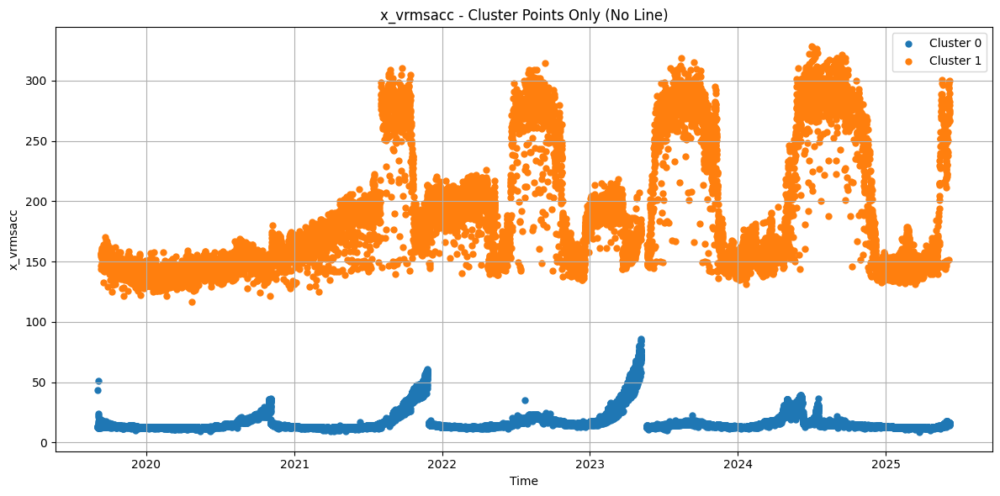

                     Sensorid  x_vrmsacc       diff  cluster
record_date                                                 
2019-09-03 04:35:48  VB39660F  43.700787   0.000000        0
2019-09-03 05:35:48  VB39660F  13.385827 -30.314961        0
2019-09-03 06:35:47  VB39660F  13.385827   0.000000        0
2019-09-03 07:35:47  VB39660F  12.992126  -0.393701        0
2019-09-03 08:35:47  VB39660F  12.598425  -0.393701        0


In [53]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# 1. データ整形
df = dfori.copy()
df['record_date'] = pd.to_datetime(df['record_date'])

# 必要な列だけ抽出（Sensorid を含める！）
df = df[['record_date', 'Sensorid', 'x_vrmsacc']].dropna()

# インデックスを設定
df = df.set_index('record_date')

# 2. 特徴量作成（値と差分）
df['diff'] = df['x_vrmsacc'].diff().fillna(0)
X = df[['x_vrmsacc', 'diff']]

# 3. クラスタリング
kmeans = KMeans(n_clusters=2, random_state=42)
df['cluster'] = kmeans.fit_predict(X)

# 4. 可視化（クラスタ点のみ）
plt.figure(figsize=(12, 6))
for label in sorted(df['cluster'].unique()):
    subset = df[df['cluster'] == label]
    plt.scatter(subset.index, subset['x_vrmsacc'], label=f"Cluster {label}", s=25)

# 装飾
plt.title("x_vrmsacc - Cluster Points Only (No Line)")
plt.xlabel("Time")
plt.ylabel("x_vrmsacc")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 5. 完成したデータフレームの確認
print(df.head())


In [54]:
df

,Sensorid,x_vrmsacc,diff,cluster
record_date,,,,
2019-09-03 04:35:48,VB39660F,43.700787,0.000000,0
2019-09-03 05:35:48,VB39660F,13.385827,-30.314961,0
2019-09-03 06:35:47,VB39660F,13.385827,0.000000,0
2019-09-03 07:35:47,VB39660F,12.992126,-0.393701,0
2019-09-03 08:35:47,VB39660F,12.598425,-0.393701,0
...,...,...,...,...
2025-06-08 00:35:08,VB39660F,15.748031,-0.787402,0
2025-06-08 01:35:08,VB39660F,15.748031,0.000000,0
2025-06-08 02:35:08,VB39660F,15.748031,0.000000,0


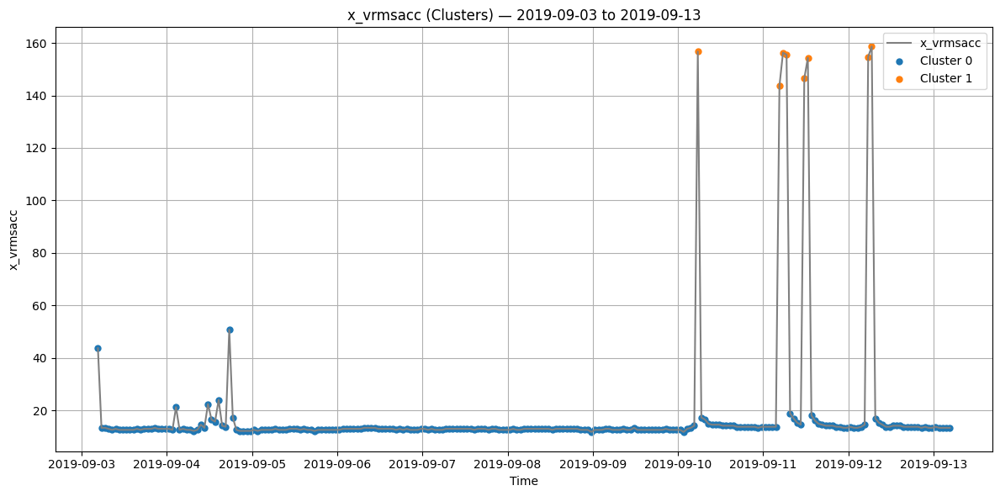

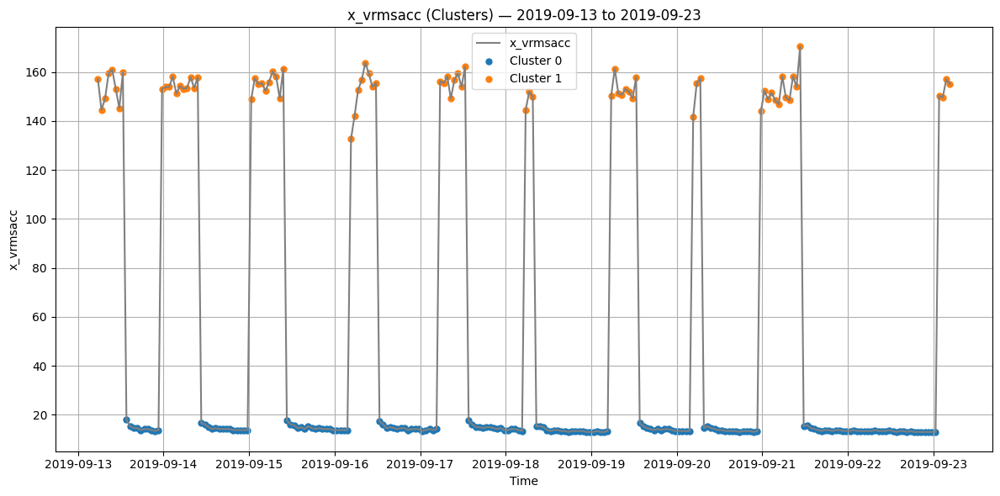

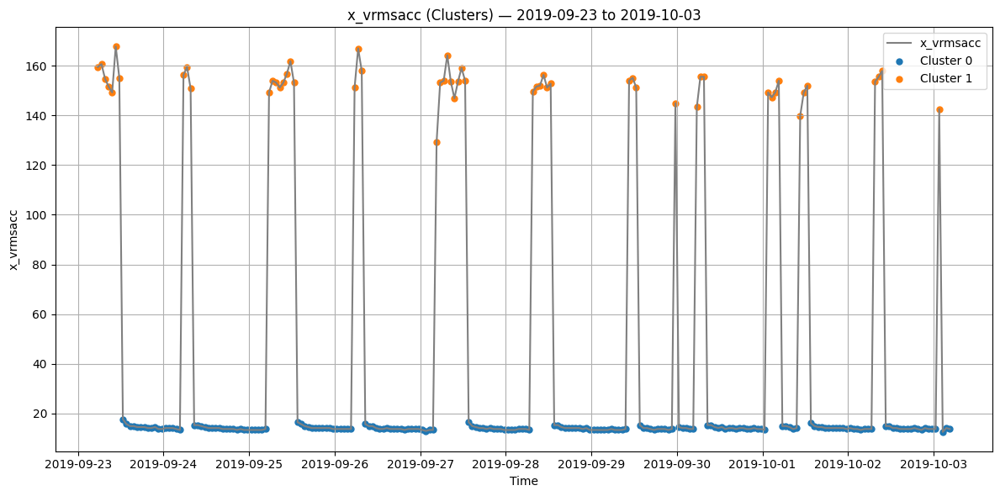

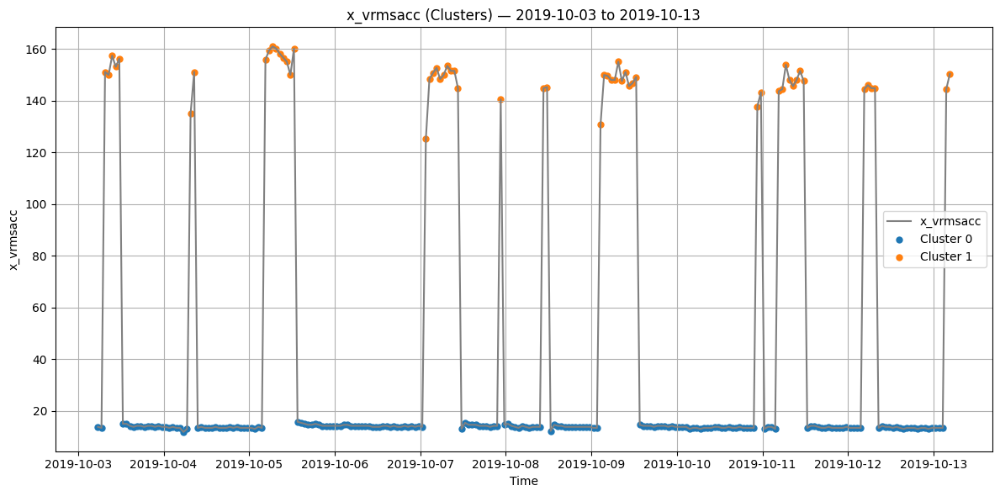

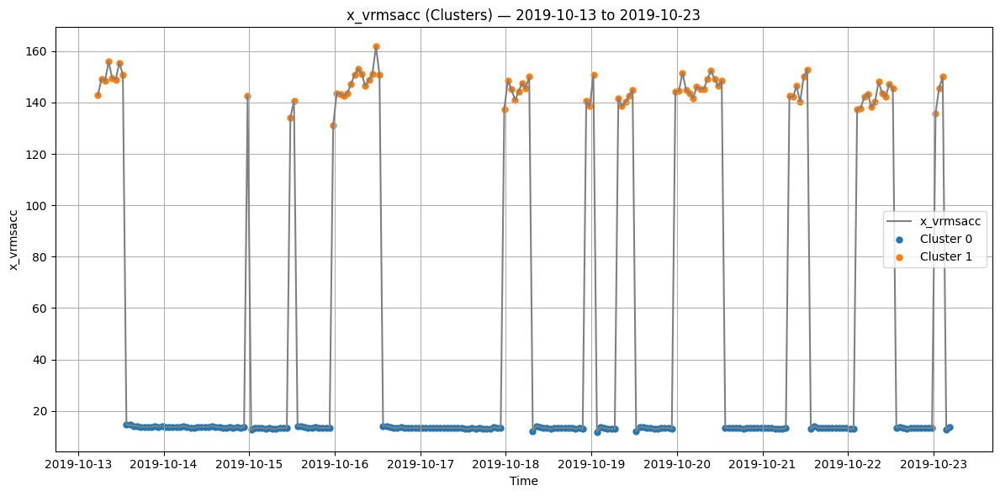

...

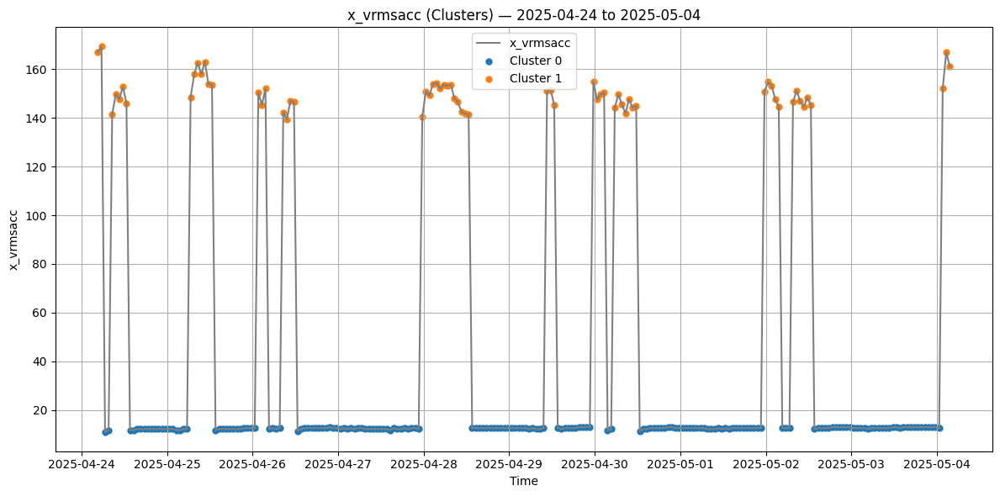

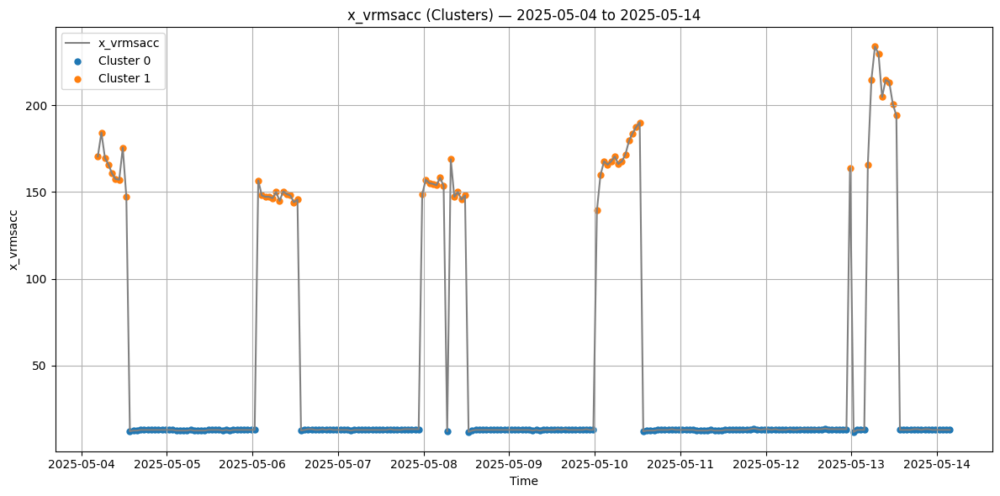

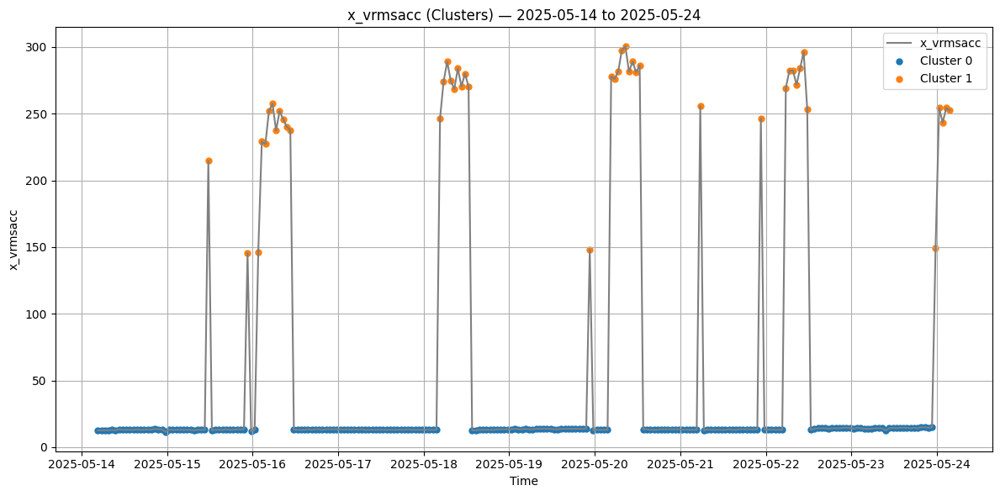

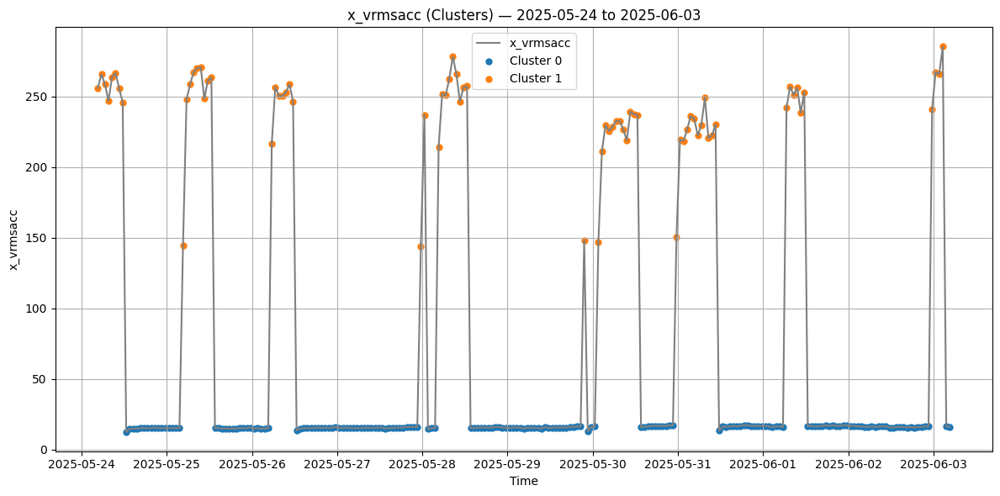

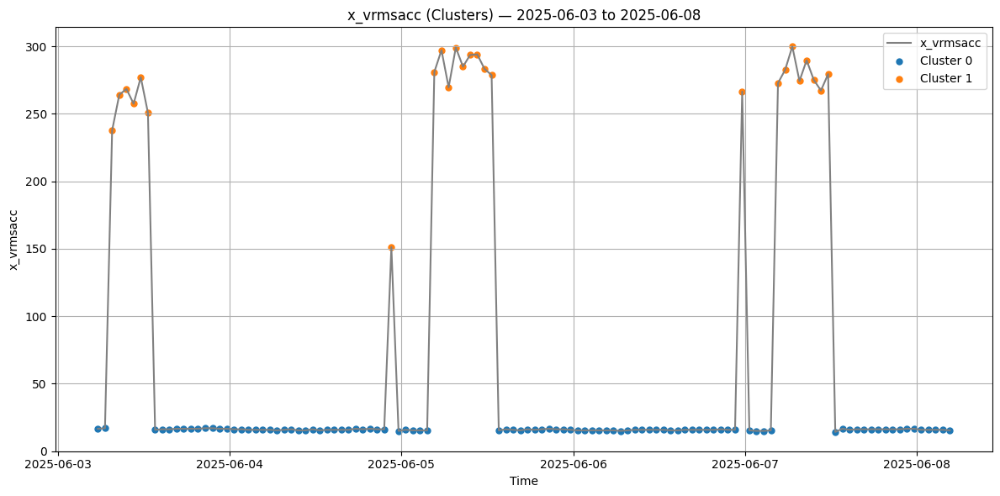

In [58]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# 1. 生データ準備
df = dfori.copy()
df['record_date'] = pd.to_datetime(df['record_date'])
df = df[['record_date', 'Sensorid', 'x_vrmsacc']].dropna()
df = df.set_index('record_date')

# 2. 差分特徴量追加（上昇・下降傾向の考慮）
df['diff'] = df['x_vrmsacc'].diff().fillna(0)
X = df[['x_vrmsacc', 'diff']]

# 3. クラスタリング
kmeans = KMeans(n_clusters=2, random_state=42)
df['cluster'] = kmeans.fit_predict(X)

# 4. 10日ごとの期間分割列を作成
start_date = df.index.min()
df['period_10d'] = ((df.index - start_date).days // 10).astype(int)

# 5. 各10日間ブロックでプロット
for period_id in sorted(df['period_10d'].unique()):
    block_df = df[df['period_10d'] == period_id]

    if len(block_df) < 2:
        continue

    plt.figure(figsize=(12, 6))

    # 折れ線（グレー）：クラスタ無視して時系列を1本で描画
    plt.plot(block_df.index, block_df['x_vrmsacc'], color='gray', label='x_vrmsacc')

    # 点：クラスタ別に色分け
    for label in sorted(block_df['cluster'].unique()):
        subset = block_df[block_df['cluster'] == label]
        plt.scatter(subset.index, subset['x_vrmsacc'], label=f"Cluster {label}", s=25)

    # タイトル・装飾
    block_start = block_df.index.min().strftime('%Y-%m-%d')
    block_end = block_df.index.max().strftime('%Y-%m-%d')
    plt.title(f"x_vrmsacc (Clusters) — {block_start} to {block_end}")
    plt.xlabel("Time")
    plt.ylabel("x_vrmsacc")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [59]:
import numpy as np

# 1. クラスタ中心（セントロイド）を取得
centroids = kmeans.cluster_centers_  # shape: (n_clusters, 2)

# 2. 各行の所属クラスタに対応する中心点を取得
assigned_centroids = centroids[df['cluster']]  # shape: (n_samples, 2)

# 3. ユークリッド距離を計算
df['distance_to_center'] = np.linalg.norm(X.values - assigned_centroids, axis=1)


In [61]:
df_final = df[['Sensorid', 'cluster', 'distance_to_center']]
df_final

,Sensorid,cluster,distance_to_center
record_date,,,
2019-09-03 04:35:48,VB39660F,0,28.137369
2019-09-03 05:35:48,VB39660F,0,21.670180
2019-09-03 06:35:47,VB39660F,0,9.664290
2019-09-03 07:35:47,VB39660F,0,9.461775
2019-09-03 08:35:47,VB39660F,0,9.636193
...,...,...,...
2025-06-08 00:35:08,VB39660F,0,8.264605
2025-06-08 01:35:08,VB39660F,0,9.043360
2025-06-08 02:35:08,VB39660F,0,9.043360
